<a href="https://colab.research.google.com/github/fitboye/GAN-research/blob/main/WGAN_SN.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!pip install -U tensorflow-addons

In [ ]:
# TensorFlow and tf.keras
import tensorflow as tf
import tensorflow_addons as tfa
# Helper libraries
import numpy as np
import cv2
import matplotlib.pyplot as plt
import random
import tensorflow_datasets as tfds
import os
import PIL
import PIL.Image
import keras

In [ ]:
#Start by connecting gdrive into the google colab
from google.colab import drive
drive.mount("/content/gdrive")

Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).


In [ ]:
os.chdir("/content/gdrive/MyDrive/Saved images")
!pwd

/content/gdrive/MyDrive/Saved images


In [ ]:
#unzips the zip file
"""
import zipfile
import os

zip_ref = zipfile.ZipFile('/content/gdrive/MyDrive/celeba.zip', 'r')
zip_ref.extractall('/tmp') #Extracts the files into the /tmp folder
"""

"\nimport zipfile\nimport os\n\nzip_ref = zipfile.ZipFile('/content/gdrive/MyDrive/celeba.zip', 'r')\nzip_ref.extractall('/tmp') #Extracts the files into the /tmp folder\n"

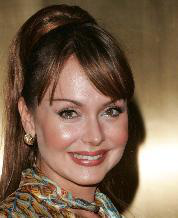

In [ ]:
filePath = "/content/gdrive/MyDrive/celeba"
sampleImage = PIL.Image.open("/tmp/img_align_celeba/000009.jpg")
sampleImage

In [ ]:
dataset = tf.data.Dataset.list_files('/tmp/img_align_celeba/*.jpg', shuffle=True)
image_count = len(os.listdir('/tmp/img_align_celeba/'))

scale = 1.0
dataset = dataset.take(int(image_count * scale))
val_size = int(image_count * scale * 0.15)
trainData = dataset.skip(int(val_size))
valData = dataset.take(val_size)
print(tf.data.experimental.cardinality(trainData).numpy())
print(tf.data.experimental.cardinality(valData).numpy())

172210
30389


In [ ]:
def decode_img(file_path):
  img = tf.io.read_file(file_path)
  # convert the compressed string to a 3D uint8 tensor
  img = tf.io.decode_jpeg(img, channels=3)
  img = tf.image.crop_to_bounding_box(img, 20, 0, 178, 178)
  #img = tf.image.rgb_to_grayscale(img)
  img = img / 255
  # resize the image to the desired size
  return tf.image.resize(img, [96, 96])

trainData = trainData.map(decode_img, num_parallel_calls=tf.data.AUTOTUNE)
valData = valData.map(decode_img, num_parallel_calls=tf.data.AUTOTUNE)

Image shape:  (96, 96, 3)


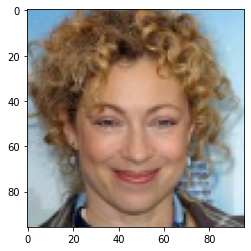

In [ ]:
for image in trainData.take(1):
  plt.imshow(image.numpy())
  #print(image)
  print("Image shape: ", image.numpy().shape)

In [ ]:
# Generation resolution - Must be square 
# Training data is also scaled to this.
# Note GENERATE_RES 4 or higher  
# will blow Google CoLab's memory and have not
# been tested extensivly.
GENERATE_RES = 3 # Generation resolution factor 
# (1=32, 2=64, 3=96, 4=128, etc.)
GENERATE_SQUARE = 32 * GENERATE_RES # rows/cols (should be square)
IMAGE_CHANNELS = 3

# Preview image 
PREVIEW_ROWS = 4
PREVIEW_COLS = 7
PREVIEW_MARGIN = 16

# Size vector to generate images from
SEED_SIZE = 100

# Configuration
DATA_PATH = '/content/drive/My Drive/projects/faces'
EPOCHS = 50
BATCH_SIZE = 64
BUFFER_SIZE = 60000

In [ ]:
batchSize = BATCH_SIZE
#trainData = trainData.cache().prefetch(buffer_size=tf.data.AUTOTUNE)
#valData = valData.cache().prefetch(buffer_size=tf.data.AUTOTUNE)
trainData = trainData.batch(batchSize)
valData = valData.batch(batchSize)

In [ ]:
from tensorflow.keras.layers import Input, Reshape, Dropout, Dense 
from tensorflow.keras.layers import Flatten, BatchNormalization, LayerNormalization
from tensorflow.keras.layers import Activation, ZeroPadding2D
from tensorflow.keras.layers import LeakyReLU
from tensorflow.keras.layers import UpSampling2D, Conv2D, Conv2DTranspose
from tensorflow.keras.models import Sequential, Model, load_model
from tensorflow.keras.optimizers import Adam
from keras.constraints import Constraint
from keras import backend
from tensorflow_addons.layers import SpectralNormalization

# clip model weights to a given hypercube
class ClipConstraint(Constraint):
	# set clip value when initialized
	def __init__(self, clip_value):
		self.clip_value = clip_value

	# clip model weights to hypercube
	def __call__(self, weights):
		return backend.clip(weights, -self.clip_value, self.clip_value)

	# get the config
	def get_config(self):
		return {'clip_value': self.clip_value}

init = tf.keras.initializers.HeNormal
regularizer = None
#tf.keras.regularizers.L2(0.01)
"""
def build_generator(seed_size, channels):
    model = Sequential()

    model.add(Dense(4*4*256,activation="relu",input_dim=seed_size, kernel_initializer = init))
    model.add(Reshape((4,4,256)))

    model.add(UpSampling2D())
    model.add(Conv2D(256,kernel_size=3,padding="same", kernel_initializer = init))
    model.add(BatchNormalization(momentum=0.8))
    model.add(Activation("relu"))

    model.add(UpSampling2D())
    model.add(Conv2D(256,kernel_size=3,padding="same", kernel_initializer = init))
    model.add(BatchNormalization(momentum=0.8))
    model.add(Activation("relu"))
   
    # Output resolution, additional upsampling
    model.add(UpSampling2D())
    model.add(Conv2D(128,kernel_size=3,padding="same", kernel_initializer = init))
    model.add(BatchNormalization(momentum=0.8))
    model.add(Activation("relu"))

    if GENERATE_RES>1:
      model.add(UpSampling2D(size=(GENERATE_RES,GENERATE_RES)))
      model.add(Conv2D(128,kernel_size=3,padding="same", kernel_initializer = init))
      model.add(BatchNormalization(momentum=0.8))
      model.add(Activation("relu"))

    #New layer
    model.add(Conv2D(128,kernel_size=3,padding="same", kernel_initializer = init))
    model.add(BatchNormalization(momentum=0.8))
    model.add(Activation("relu"))

    # Final CNN layer
    model.add(Conv2D(channels,kernel_size=3,padding="same"))
    model.add(Activation("sigmoid"))

    return model

def build_discriminator(image_shape):
    model = Sequential()
    const = None

    model.add(Conv2D(32, kernel_size=3, strides=2, input_shape=image_shape, padding="same", kernel_initializer = init, kernel_regularizer = regularizer))
    model.add(LeakyReLU(alpha=0.2))

    model.add(SpectralNormalization(Conv2D(64, kernel_size=3, strides=2, padding="same", kernel_initializer = init, kernel_regularizer = regularizer)))
    model.add(ZeroPadding2D(padding=((0,1),(0,1))))
    model.add(BatchNormalization(momentum=0.8))
    model.add(LeakyReLU(alpha=0.2))

    model.add(SpectralNormalization(Conv2D(128, kernel_size=3, strides=2, padding="same", kernel_initializer = init, kernel_regularizer = regularizer)))
    model.add(BatchNormalization(momentum=0.8))
    model.add(LeakyReLU(alpha=0.2))

    model.add(SpectralNormalization(Conv2D(256, kernel_size=3, strides=1, padding="same", kernel_initializer = init, kernel_regularizer = regularizer)))
    model.add(BatchNormalization(momentum=0.8))
    model.add(LeakyReLU(alpha=0.2))

    model.add(SpectralNormalization(Conv2D(512, kernel_size=3, strides=1, padding="same", kernel_initializer = init, kernel_regularizer = regularizer)))
    model.add(BatchNormalization(momentum=0.8))
    model.add(LeakyReLU(alpha=0.2))

    model.add(Flatten())
    model.add(SpectralNormalization(Dense(1, activation='linear')))

    return model
"""
def build_generator(seed_size, channels):
    model = Sequential()

    model.add(Dense(12*12*512,activation="relu",input_dim=seed_size, kernel_initializer = init))
    model.add(Reshape((12,12,512)))

    model.add(Conv2DTranspose(256 ,kernel_size=4, strides = (2,2), padding="same", kernel_initializer = init))
    model.add(BatchNormalization(momentum=0.8))
    model.add(Activation("relu"))

    model.add(Conv2DTranspose(128 ,kernel_size=4, strides = (2,2), padding="same", kernel_initializer = init))
    model.add(BatchNormalization(momentum=0.8))
    model.add(Activation("relu"))
   
    model.add(Conv2DTranspose(64 ,kernel_size=4, strides = (2,2), padding="same", kernel_initializer = init))
    model.add(BatchNormalization(momentum=0.8))
    model.add(Activation("relu"))

    model.add(Conv2D(channels,kernel_size=3,padding="same"))
    model.add(Activation("sigmoid"))

    return model

def build_discriminator(image_shape):
    model = Sequential()
    const = None

    model.add(SpectralNormalization(Conv2D(32, kernel_size=4, strides=2, input_shape=image_shape, padding="same", kernel_initializer = init, kernel_regularizer = regularizer)))
    model.add(LeakyReLU(alpha=0.2))

    model.add(SpectralNormalization(Conv2D(64, kernel_size=4, strides=2, padding="same", kernel_initializer = init, kernel_regularizer = regularizer)))
    model.add(BatchNormalization(momentum=0.8))
    model.add(LeakyReLU(alpha=0.2))

    model.add(SpectralNormalization(Conv2D(128, kernel_size=4, strides=2, padding="same", kernel_initializer = init, kernel_regularizer = regularizer)))
    model.add(BatchNormalization(momentum=0.8))
    model.add(LeakyReLU(alpha=0.2))

    model.add(SpectralNormalization(Conv2D(256, kernel_size=4, strides=2, padding="same", kernel_initializer = init, kernel_regularizer = regularizer)))
    model.add(BatchNormalization(momentum=0.8))
    model.add(LeakyReLU(alpha=0.2))

    model.add(SpectralNormalization(Conv2D(512, kernel_size=4, strides=2, padding="same", kernel_initializer = init, kernel_regularizer = regularizer)))
    model.add(BatchNormalization(momentum=0.8))
    model.add(LeakyReLU(alpha=0.2))

    model.add(Flatten())
    model.add(SpectralNormalization(Dense(1, activation='linear')))

    return model

(1, 96, 96, 3)


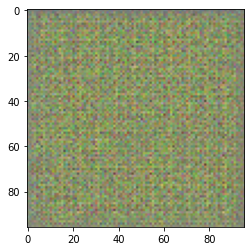

In [ ]:
generator = build_generator(SEED_SIZE, IMAGE_CHANNELS)
#generator = keras.models.load_model("/content/gdrive/MyDrive/generator-VWGAN-SN", compile=False)

noise = tf.random.normal([1, SEED_SIZE])
generated_image = generator(noise, training=False)

#print(generated_image)
plt.imshow(generated_image[0])
plt.savefig("generatedImage")
print(generated_image.shape)

In [ ]:
image_shape = (GENERATE_SQUARE,GENERATE_SQUARE,IMAGE_CHANNELS)

discriminator = build_discriminator(image_shape)
#discriminator = keras.models.load_model("/content/gdrive/MyDrive/discriminator-VWGAN-SN", compile=False)
decision = discriminator(generated_image)
print (decision)

tf.Tensor([[0.70870423]], shape=(1, 1), dtype=float32)


In [ ]:
    def gradient_penalty(batch_size, real_images, fake_images):
        """ Calculates the gradient penalty.

        This loss is calculated on an interpolated image
        and added to the discriminator loss.
        """
        # Get the interpolated image
        alpha = tf.random.normal([batch_size, 1, 1, 1], 0.0, 1.0)
        diff = fake_images - real_images
        interpolated = real_images + alpha * diff

        with tf.GradientTape() as gp_tape:
            gp_tape.watch(interpolated)
            # 1. Get the discriminator output for this interpolated image.
            pred = discriminator(interpolated, training=True)

        # 2. Calculate the gradients w.r.t to this interpolated image.
        grads = gp_tape.gradient(pred, [interpolated])[0]
        # 3. Calculate the norm of the gradients.
        norm = tf.sqrt(tf.reduce_sum(tf.square(grads), axis=[1, 2, 3]))
        gp = tf.reduce_mean((norm - 1.0) ** 2)
        return gp

In [ ]:
cross_entropy = tf.keras.losses.BinaryCrossentropy()
def wLoss(y_true, y_pred):
	return backend.mean(y_true * y_pred)

def discriminator_loss(real_output, fake_output):
  real_loss = wLoss(tf.ones_like(real_output), real_output)
  fake_loss = wLoss(-tf.ones_like(fake_output), fake_output)
  loss = real_loss + fake_loss
  return loss
  
def generator_loss(fake_output):
    return wLoss(tf.ones_like(fake_output), fake_output)

In [ ]:
generator_optimizer = tf.keras.optimizers.RMSprop(0.0001)
discriminator_optimizer = tf.keras.optimizers.RMSprop(0.0002)

In [ ]:
alpha = 10
@tf.function
def train_step(images):
  seed = tf.random.normal([BATCH_SIZE, SEED_SIZE])

  with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
    generated_images = generator(seed, training=True)

    real_output = discriminator(images, training=True)
    fake_output = discriminator(generated_images, training=True)

    gen_loss = generator_loss(fake_output)
    gp = alpha * gradient_penalty(BATCH_SIZE, images, generated_images)
    disc_loss = discriminator_loss(real_output, fake_output) + gp
    
    gradients_of_generator = gen_tape.gradient(gen_loss, generator.trainable_variables)
    gradients_of_discriminator = disc_tape.gradient(disc_loss, discriminator.trainable_variables)

    generator_optimizer.apply_gradients(zip(gradients_of_generator, generator.trainable_variables))
    discriminator_optimizer.apply_gradients(zip(gradients_of_discriminator, discriminator.trainable_variables))
  return gen_loss,disc_loss,

@tf.function
def train_step_disc(images):
  seed = tf.random.normal([BATCH_SIZE, SEED_SIZE])

  with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
    generated_images = generator(seed, training=False)

    real_output = discriminator(images, training=True)
    fake_output = discriminator(generated_images, training=True)

    gp = alpha * gradient_penalty(BATCH_SIZE, images, generated_images)
    disc_loss = discriminator_loss(real_output, fake_output) + gp
    
    gradients_of_discriminator = disc_tape.gradient(disc_loss, discriminator.trainable_variables)

    discriminator_optimizer.apply_gradients(zip(gradients_of_discriminator, discriminator.trainable_variables))
  return disc_loss

In [ ]:
@tf.function
def val_step(images):
  seed = tf.random.normal([BATCH_SIZE, SEED_SIZE])

  generated_images = generator(seed, training=False)

  real_output = discriminator(images, training=False)
  fake_output = discriminator(generated_images, training=False)

  return real_output,fake_output

300
tf.Tensor(45.26539, shape=(), dtype=float32) tf.Tensor(-91.267006, shape=(), dtype=float32)


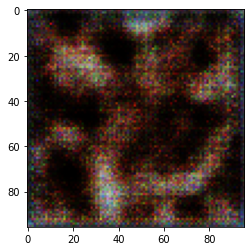

600
tf.Tensor(53.145115, shape=(), dtype=float32) tf.Tensor(-107.59769, shape=(), dtype=float32)


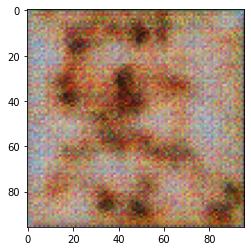

900
tf.Tensor(60.999836, shape=(), dtype=float32) tf.Tensor(-123.954315, shape=(), dtype=float32)


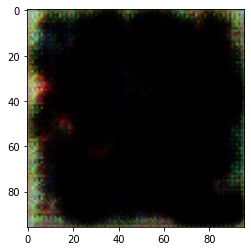

1200
tf.Tensor(67.60682, shape=(), dtype=float32) tf.Tensor(-138.74934, shape=(), dtype=float32)


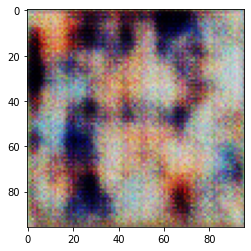

1500
tf.Tensor(75.26775, shape=(), dtype=float32) tf.Tensor(-154.49588, shape=(), dtype=float32)


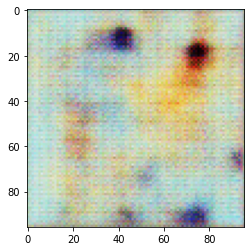

1800
tf.Tensor(83.35732, shape=(), dtype=float32) tf.Tensor(-170.94405, shape=(), dtype=float32)


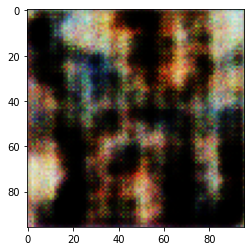

2100
tf.Tensor(91.408195, shape=(), dtype=float32) tf.Tensor(-186.74773, shape=(), dtype=float32)


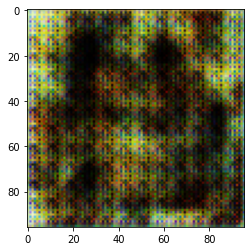

2400
tf.Tensor(98.62535, shape=(), dtype=float32) tf.Tensor(-201.77055, shape=(), dtype=float32)


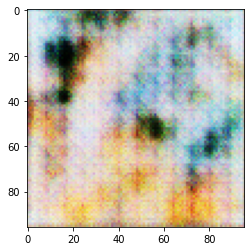

INFO:tensorflow:Assets written to: /content/gdrive/MyDrive/generator-VWGAN-SN/assets


INFO:tensorflow:Assets written to: /content/gdrive/MyDrive/discriminator-VWGAN-SN/assets


INFO:tensorflow:Assets written to: /content/gdrive/MyDrive/discriminator-VWGAN-SN/assets


Epoch 1, gen loss=105.67363739013672,disc loss=-216.06866455078125,
Accuracy:  0.5001809865411827
Accuracy on fake:  1.0003619730823654
300
tf.Tensor(182.83022, shape=(), dtype=float32) tf.Tensor(-370.61105, shape=(), dtype=float32)


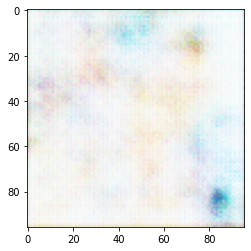

600
tf.Tensor(189.25319, shape=(), dtype=float32) tf.Tensor(-385.89816, shape=(), dtype=float32)


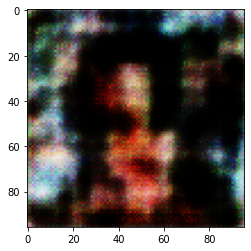

900
tf.Tensor(196.49841, shape=(), dtype=float32) tf.Tensor(-402.22104, shape=(), dtype=float32)


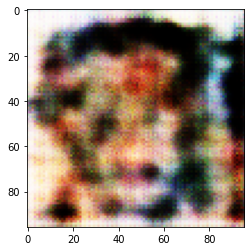

1200
tf.Tensor(204.5822, shape=(), dtype=float32) tf.Tensor(-418.72574, shape=(), dtype=float32)


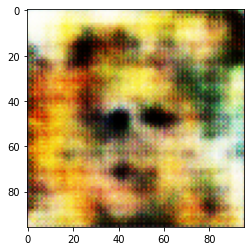

1500
tf.Tensor(211.81111, shape=(), dtype=float32) tf.Tensor(-434.00195, shape=(), dtype=float32)


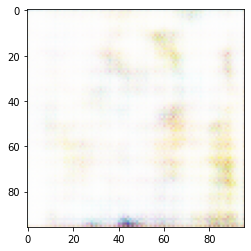

1800
tf.Tensor(220.12804, shape=(), dtype=float32) tf.Tensor(-450.9642, shape=(), dtype=float32)


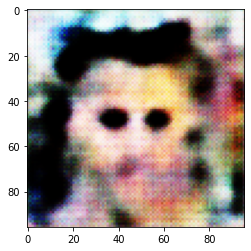

2100
tf.Tensor(227.92874, shape=(), dtype=float32) tf.Tensor(-466.41544, shape=(), dtype=float32)


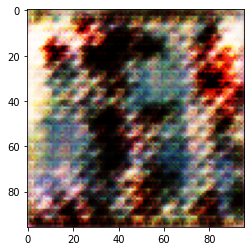

2400
tf.Tensor(234.71211, shape=(), dtype=float32) tf.Tensor(-480.52087, shape=(), dtype=float32)


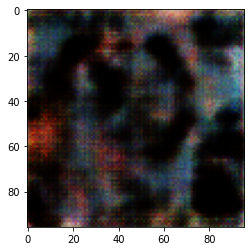

INFO:tensorflow:Assets written to: /content/gdrive/MyDrive/generator-VWGAN-SN/assets


INFO:tensorflow:Assets written to: /content/gdrive/MyDrive/generator-VWGAN-SN/assets


INFO:tensorflow:Assets written to: /content/gdrive/MyDrive/discriminator-VWGAN-SN/assets


INFO:tensorflow:Assets written to: /content/gdrive/MyDrive/discriminator-VWGAN-SN/assets


Epoch 2, gen loss=242.09629821777344,disc loss=-494.7059020996094,
Accuracy:  0.5001809865411827
Accuracy on fake:  1.0003619730823654
300
tf.Tensor(313.6472, shape=(), dtype=float32) tf.Tensor(-639.0578, shape=(), dtype=float32)


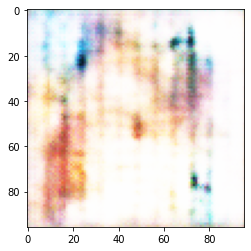

600
tf.Tensor(317.79242, shape=(), dtype=float32) tf.Tensor(-653.4577, shape=(), dtype=float32)


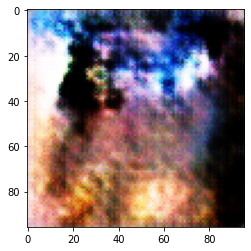

900
tf.Tensor(322.7941, shape=(), dtype=float32) tf.Tensor(-667.12103, shape=(), dtype=float32)


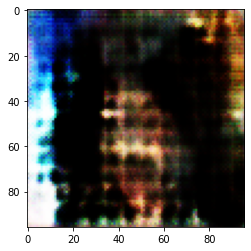

1200
tf.Tensor(329.51764, shape=(), dtype=float32) tf.Tensor(-681.997, shape=(), dtype=float32)


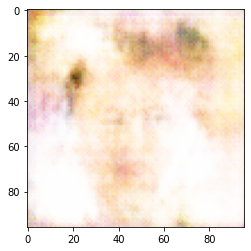

1500
tf.Tensor(335.3035, shape=(), dtype=float32) tf.Tensor(-697.0778, shape=(), dtype=float32)


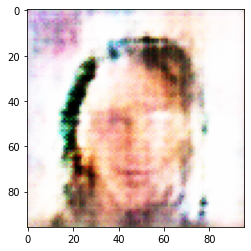

1800
tf.Tensor(342.39865, shape=(), dtype=float32) tf.Tensor(-711.3735, shape=(), dtype=float32)


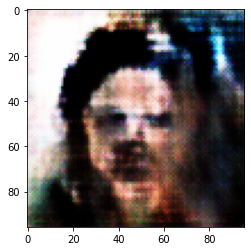

2100
tf.Tensor(349.43118, shape=(), dtype=float32) tf.Tensor(-725.19916, shape=(), dtype=float32)


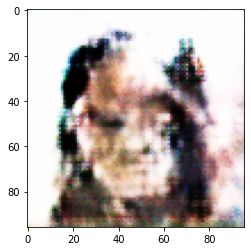

2400
tf.Tensor(356.92593, shape=(), dtype=float32) tf.Tensor(-740.13293, shape=(), dtype=float32)


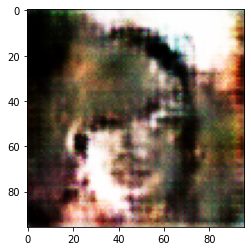

INFO:tensorflow:Assets written to: /content/gdrive/MyDrive/generator-VWGAN-SN/assets


INFO:tensorflow:Assets written to: /content/gdrive/MyDrive/generator-VWGAN-SN/assets


INFO:tensorflow:Assets written to: /content/gdrive/MyDrive/discriminator-VWGAN-SN/assets


INFO:tensorflow:Assets written to: /content/gdrive/MyDrive/discriminator-VWGAN-SN/assets


Epoch 3, gen loss=364.277099609375,disc loss=-754.332763671875,
Accuracy:  0.5001809865411827
Accuracy on fake:  1.0003619730823654
300
tf.Tensor(443.4991, shape=(), dtype=float32) tf.Tensor(-902.7525, shape=(), dtype=float32)


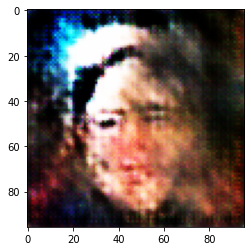

600
tf.Tensor(443.05386, shape=(), dtype=float32) tf.Tensor(-914.6138, shape=(), dtype=float32)


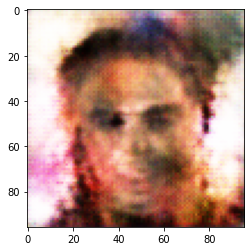

900
tf.Tensor(447.33383, shape=(), dtype=float32) tf.Tensor(-929.51685, shape=(), dtype=float32)


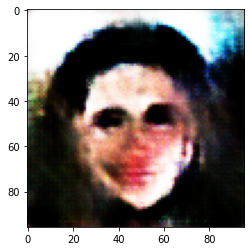

1200
tf.Tensor(455.40808, shape=(), dtype=float32) tf.Tensor(-943.61865, shape=(), dtype=float32)


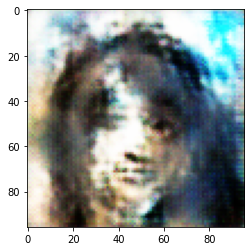

1500
tf.Tensor(460.59464, shape=(), dtype=float32) tf.Tensor(-956.62714, shape=(), dtype=float32)


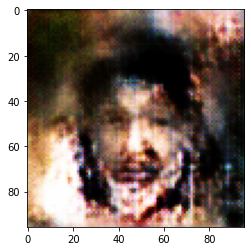

1800
tf.Tensor(466.8329, shape=(), dtype=float32) tf.Tensor(-970.30475, shape=(), dtype=float32)


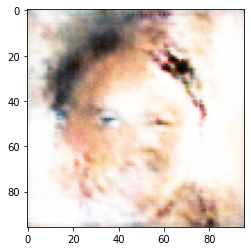

2100
tf.Tensor(473.06738, shape=(), dtype=float32) tf.Tensor(-984.3007, shape=(), dtype=float32)


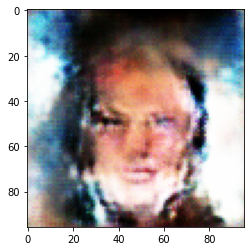

2400
tf.Tensor(480.9675, shape=(), dtype=float32) tf.Tensor(-999.4601, shape=(), dtype=float32)


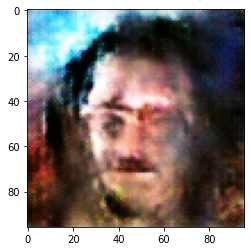

INFO:tensorflow:Assets written to: /content/gdrive/MyDrive/generator-VWGAN-SN/assets


INFO:tensorflow:Assets written to: /content/gdrive/MyDrive/generator-VWGAN-SN/assets


INFO:tensorflow:Assets written to: /content/gdrive/MyDrive/discriminator-VWGAN-SN/assets


INFO:tensorflow:Assets written to: /content/gdrive/MyDrive/discriminator-VWGAN-SN/assets


Epoch 4, gen loss=486.0515441894531,disc loss=-1012.0257568359375,
Accuracy:  0.5001809865411827
Accuracy on fake:  1.0003619730823654
300
tf.Tensor(556.106, shape=(), dtype=float32) tf.Tensor(-1157.654, shape=(), dtype=float32)


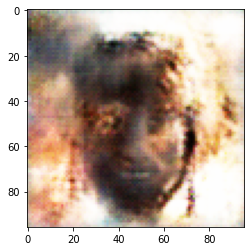

600
tf.Tensor(564.48865, shape=(), dtype=float32) tf.Tensor(-1175.5692, shape=(), dtype=float32)


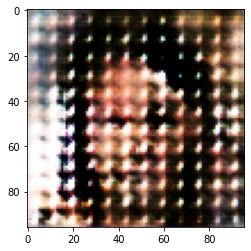

900
tf.Tensor(577.12915, shape=(), dtype=float32) tf.Tensor(-1192.577, shape=(), dtype=float32)


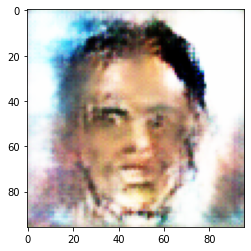

1200
tf.Tensor(580.6024, shape=(), dtype=float32) tf.Tensor(-1203.4479, shape=(), dtype=float32)


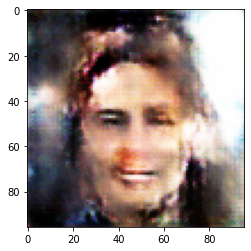

1500
tf.Tensor(587.80835, shape=(), dtype=float32) tf.Tensor(-1220.6042, shape=(), dtype=float32)


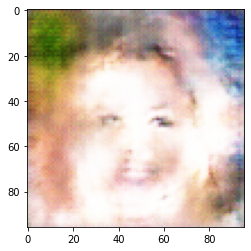

1800
tf.Tensor(595.2972, shape=(), dtype=float32) tf.Tensor(-1233.5591, shape=(), dtype=float32)


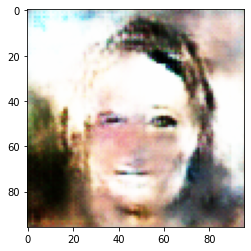

2100
tf.Tensor(602.4643, shape=(), dtype=float32) tf.Tensor(-1246.7391, shape=(), dtype=float32)


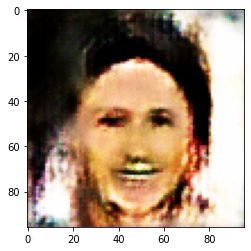

2400
tf.Tensor(606.7157, shape=(), dtype=float32) tf.Tensor(-1259.0044, shape=(), dtype=float32)


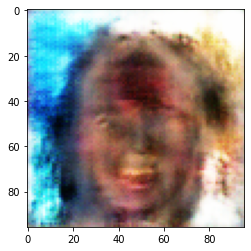

INFO:tensorflow:Assets written to: /content/gdrive/MyDrive/generator-VWGAN-SN/assets


INFO:tensorflow:Assets written to: /content/gdrive/MyDrive/generator-VWGAN-SN/assets


INFO:tensorflow:Assets written to: /content/gdrive/MyDrive/discriminator-VWGAN-SN/assets


INFO:tensorflow:Assets written to: /content/gdrive/MyDrive/discriminator-VWGAN-SN/assets


Epoch 5, gen loss=610.937255859375,disc loss=-1269.115966796875,
Accuracy:  0.5001809865411827
Accuracy on fake:  1.0003619730823654
300
tf.Tensor(669.6816, shape=(), dtype=float32) tf.Tensor(-1396.4252, shape=(), dtype=float32)


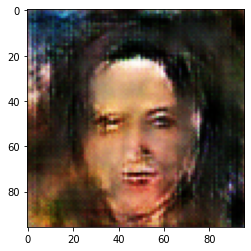

600
tf.Tensor(678.4561, shape=(), dtype=float32) tf.Tensor(-1403.5269, shape=(), dtype=float32)


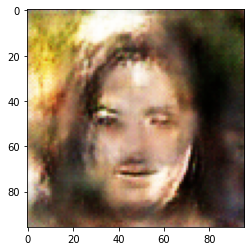

900
tf.Tensor(683.559, shape=(), dtype=float32) tf.Tensor(-1419.3982, shape=(), dtype=float32)


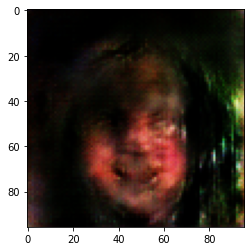

1200
tf.Tensor(684.8322, shape=(), dtype=float32) tf.Tensor(-1431.1531, shape=(), dtype=float32)


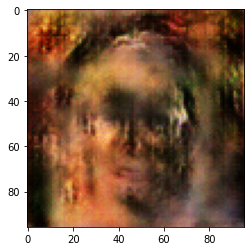

1500
tf.Tensor(691.6987, shape=(), dtype=float32) tf.Tensor(-1442.9087, shape=(), dtype=float32)


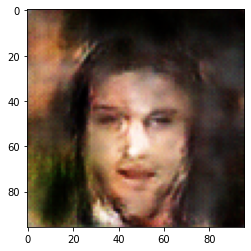

1800
tf.Tensor(699.51996, shape=(), dtype=float32) tf.Tensor(-1454.8628, shape=(), dtype=float32)


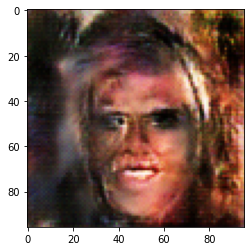

2100
tf.Tensor(704.667, shape=(), dtype=float32) tf.Tensor(-1466.565, shape=(), dtype=float32)


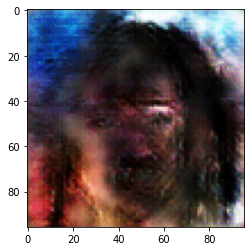

2400
tf.Tensor(711.5396, shape=(), dtype=float32) tf.Tensor(-1479.8158, shape=(), dtype=float32)


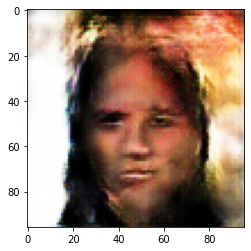

INFO:tensorflow:Assets written to: /content/gdrive/MyDrive/generator-VWGAN-SN/assets


INFO:tensorflow:Assets written to: /content/gdrive/MyDrive/generator-VWGAN-SN/assets


INFO:tensorflow:Assets written to: /content/gdrive/MyDrive/discriminator-VWGAN-SN/assets


INFO:tensorflow:Assets written to: /content/gdrive/MyDrive/discriminator-VWGAN-SN/assets


Epoch 6, gen loss=715.0772094726562,disc loss=-1489.666259765625,
Accuracy:  0.5001809865411827
Accuracy on fake:  1.0003619730823654
300
tf.Tensor(744.3475, shape=(), dtype=float32) tf.Tensor(-1605.7552, shape=(), dtype=float32)


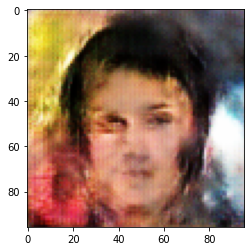

600
tf.Tensor(764.0079, shape=(), dtype=float32) tf.Tensor(-1620.622, shape=(), dtype=float32)


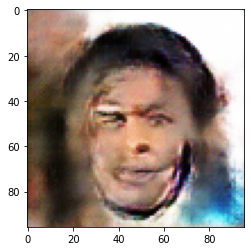

900
tf.Tensor(760.5701, shape=(), dtype=float32) tf.Tensor(-1629.9232, shape=(), dtype=float32)


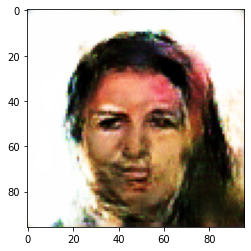

1200
tf.Tensor(763.48004, shape=(), dtype=float32) tf.Tensor(-1638.2225, shape=(), dtype=float32)


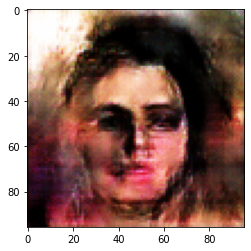

1500
tf.Tensor(773.16895, shape=(), dtype=float32) tf.Tensor(-1649.7803, shape=(), dtype=float32)


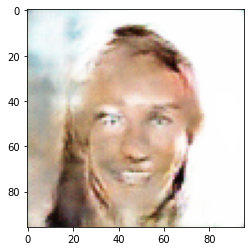

1800
tf.Tensor(780.0482, shape=(), dtype=float32) tf.Tensor(-1661.8115, shape=(), dtype=float32)


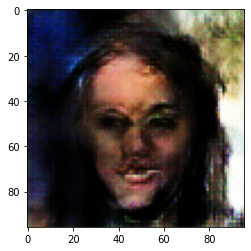

2100
tf.Tensor(788.04016, shape=(), dtype=float32) tf.Tensor(-1674.8839, shape=(), dtype=float32)


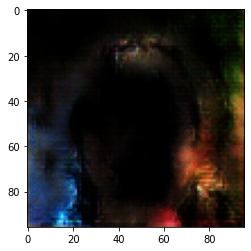

2400
tf.Tensor(793.87445, shape=(), dtype=float32) tf.Tensor(-1688.5337, shape=(), dtype=float32)


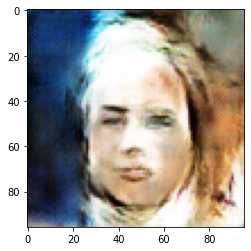

INFO:tensorflow:Assets written to: /content/gdrive/MyDrive/generator-VWGAN-SN/assets


INFO:tensorflow:Assets written to: /content/gdrive/MyDrive/generator-VWGAN-SN/assets


INFO:tensorflow:Assets written to: /content/gdrive/MyDrive/discriminator-VWGAN-SN/assets


INFO:tensorflow:Assets written to: /content/gdrive/MyDrive/discriminator-VWGAN-SN/assets


Epoch 7, gen loss=801.2006225585938,disc loss=-1701.9847412109375,
Accuracy:  0.5001809865411827
Accuracy on fake:  1.0003619730823654
300
tf.Tensor(851.92267, shape=(), dtype=float32) tf.Tensor(-1812.3042, shape=(), dtype=float32)


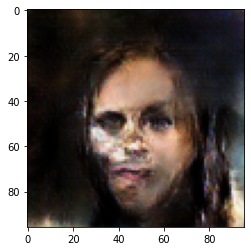

600
tf.Tensor(842.8462, shape=(), dtype=float32) tf.Tensor(-1821.6683, shape=(), dtype=float32)


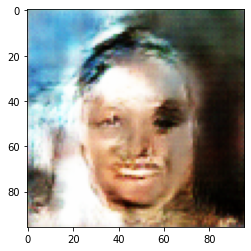

900
tf.Tensor(849.7366, shape=(), dtype=float32) tf.Tensor(-1839.6816, shape=(), dtype=float32)


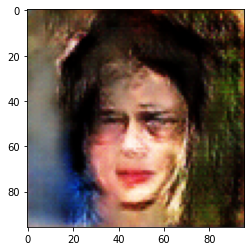

1200
tf.Tensor(860.5383, shape=(), dtype=float32) tf.Tensor(-1856.3602, shape=(), dtype=float32)


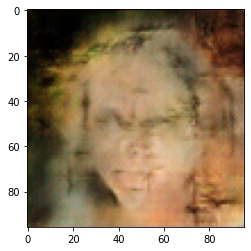

1500
tf.Tensor(861.2813, shape=(), dtype=float32) tf.Tensor(-1868.5205, shape=(), dtype=float32)


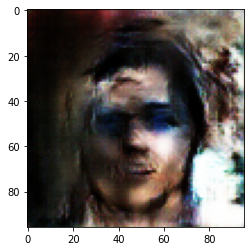

1800
tf.Tensor(871.9087, shape=(), dtype=float32) tf.Tensor(-1880.7491, shape=(), dtype=float32)


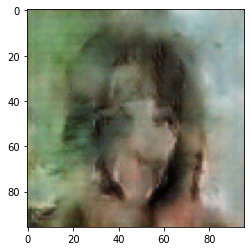

2100
tf.Tensor(878.3532, shape=(), dtype=float32) tf.Tensor(-1893.273, shape=(), dtype=float32)


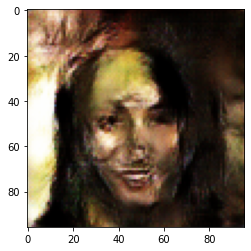

2400
tf.Tensor(881.68604, shape=(), dtype=float32) tf.Tensor(-1903.344, shape=(), dtype=float32)


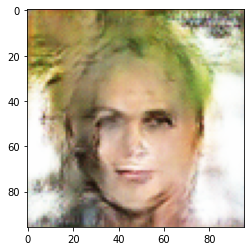

INFO:tensorflow:Assets written to: /content/gdrive/MyDrive/generator-VWGAN-SN/assets


INFO:tensorflow:Assets written to: /content/gdrive/MyDrive/generator-VWGAN-SN/assets


INFO:tensorflow:Assets written to: /content/gdrive/MyDrive/discriminator-VWGAN-SN/assets


INFO:tensorflow:Assets written to: /content/gdrive/MyDrive/discriminator-VWGAN-SN/assets


Epoch 8, gen loss=887.7974853515625,disc loss=-1913.5440673828125,
Accuracy:  0.5001809865411827
Accuracy on fake:  1.0003619730823654
300
tf.Tensor(891.7407, shape=(), dtype=float32) tf.Tensor(-2008.2606, shape=(), dtype=float32)


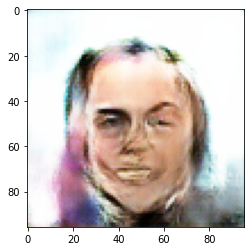

600
tf.Tensor(921.8955, shape=(), dtype=float32) tf.Tensor(-2023.25, shape=(), dtype=float32)


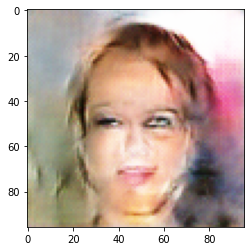

900
tf.Tensor(934.0652, shape=(), dtype=float32) tf.Tensor(-2039.672, shape=(), dtype=float32)


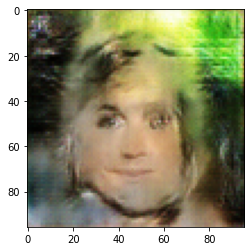

1200
tf.Tensor(948.07166, shape=(), dtype=float32) tf.Tensor(-2051.7822, shape=(), dtype=float32)


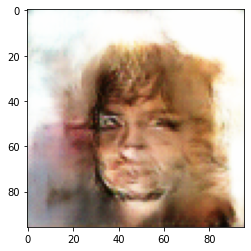

1500
tf.Tensor(950.56824, shape=(), dtype=float32) tf.Tensor(-2061.7485, shape=(), dtype=float32)


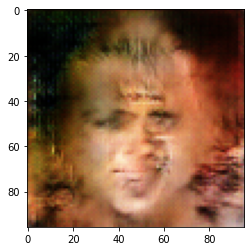

1800
tf.Tensor(952.29694, shape=(), dtype=float32) tf.Tensor(-2068.1687, shape=(), dtype=float32)


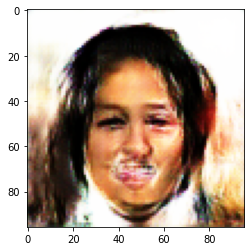

2100
tf.Tensor(958.1136, shape=(), dtype=float32) tf.Tensor(-2081.804, shape=(), dtype=float32)


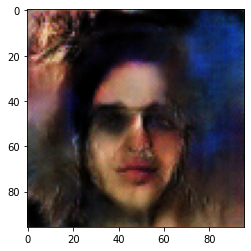

2400
tf.Tensor(958.02185, shape=(), dtype=float32) tf.Tensor(-2087.2493, shape=(), dtype=float32)


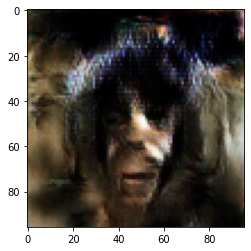

INFO:tensorflow:Assets written to: /content/gdrive/MyDrive/generator-VWGAN-SN/assets


INFO:tensorflow:Assets written to: /content/gdrive/MyDrive/generator-VWGAN-SN/assets


INFO:tensorflow:Assets written to: /content/gdrive/MyDrive/discriminator-VWGAN-SN/assets


INFO:tensorflow:Assets written to: /content/gdrive/MyDrive/discriminator-VWGAN-SN/assets


Epoch 9, gen loss=963.7208862304688,disc loss=-2099.73486328125,
Accuracy:  0.5001809865411827
Accuracy on fake:  1.0003619730823654
300
tf.Tensor(997.12427, shape=(), dtype=float32) tf.Tensor(-2216.507, shape=(), dtype=float32)


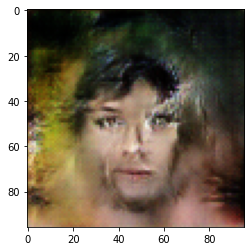

600
tf.Tensor(1029.7484, shape=(), dtype=float32) tf.Tensor(-2231.1528, shape=(), dtype=float32)


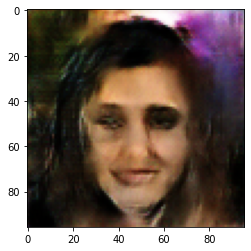

900
tf.Tensor(1027.4888, shape=(), dtype=float32) tf.Tensor(-2240.092, shape=(), dtype=float32)


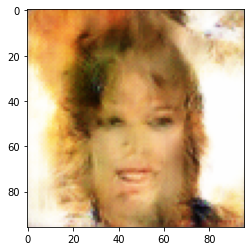

1200
tf.Tensor(1029.7546, shape=(), dtype=float32) tf.Tensor(-2245.732, shape=(), dtype=float32)


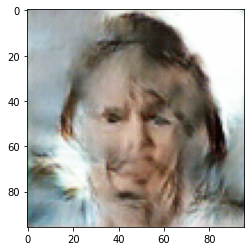

1500
tf.Tensor(1029.4601, shape=(), dtype=float32) tf.Tensor(-2250.7495, shape=(), dtype=float32)


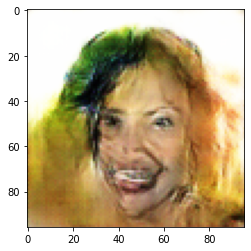

1800
tf.Tensor(1034.4111, shape=(), dtype=float32) tf.Tensor(-2259.6094, shape=(), dtype=float32)


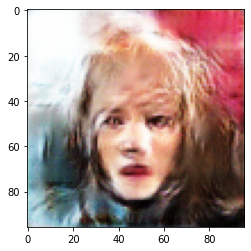

2100
tf.Tensor(1045.9375, shape=(), dtype=float32) tf.Tensor(-2267.579, shape=(), dtype=float32)


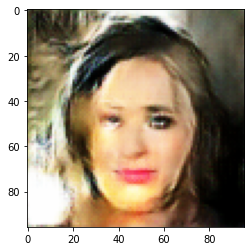

2400
tf.Tensor(1045.1056, shape=(), dtype=float32) tf.Tensor(-2280.2634, shape=(), dtype=float32)


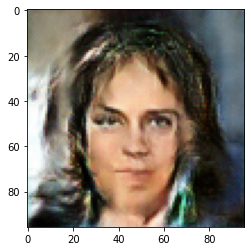

INFO:tensorflow:Assets written to: /content/gdrive/MyDrive/generator-VWGAN-SN/assets


INFO:tensorflow:Assets written to: /content/gdrive/MyDrive/generator-VWGAN-SN/assets


INFO:tensorflow:Assets written to: /content/gdrive/MyDrive/discriminator-VWGAN-SN/assets


INFO:tensorflow:Assets written to: /content/gdrive/MyDrive/discriminator-VWGAN-SN/assets


Epoch 10, gen loss=1054.939453125,disc loss=-2294.636962890625,
Accuracy:  0.5001809865411827
Accuracy on fake:  1.0003619730823654
300
tf.Tensor(1127.6128, shape=(), dtype=float32) tf.Tensor(-2425.2263, shape=(), dtype=float32)


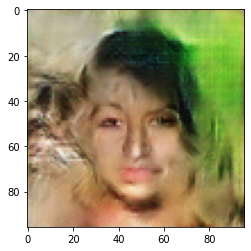

600
tf.Tensor(1150.1549, shape=(), dtype=float32) tf.Tensor(-2429.7576, shape=(), dtype=float32)


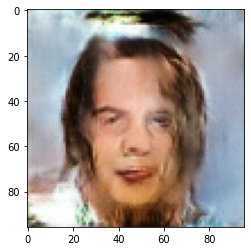

900
tf.Tensor(1152.8381, shape=(), dtype=float32) tf.Tensor(-2437.1597, shape=(), dtype=float32)


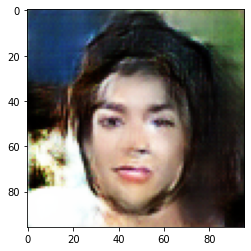

1200
tf.Tensor(1132.84, shape=(), dtype=float32) tf.Tensor(-2446.3618, shape=(), dtype=float32)


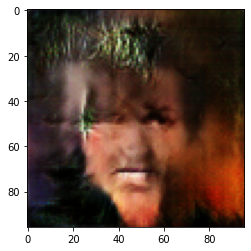

1500
tf.Tensor(1132.1201, shape=(), dtype=float32) tf.Tensor(-2456.5132, shape=(), dtype=float32)


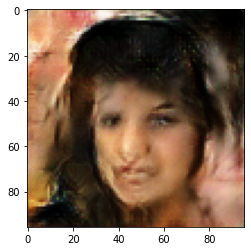

1800
tf.Tensor(1141.1176, shape=(), dtype=float32) tf.Tensor(-2472.3022, shape=(), dtype=float32)


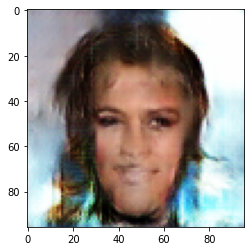

2100
tf.Tensor(1157.5681, shape=(), dtype=float32) tf.Tensor(-2488.44, shape=(), dtype=float32)


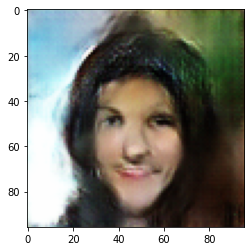

2400
tf.Tensor(1162.5718, shape=(), dtype=float32) tf.Tensor(-2502.1848, shape=(), dtype=float32)


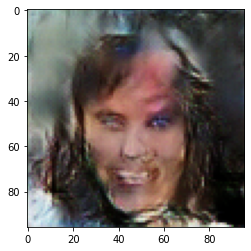

INFO:tensorflow:Assets written to: /content/gdrive/MyDrive/generator-VWGAN-SN/assets


INFO:tensorflow:Assets written to: /content/gdrive/MyDrive/generator-VWGAN-SN/assets


INFO:tensorflow:Assets written to: /content/gdrive/MyDrive/discriminator-VWGAN-SN/assets


INFO:tensorflow:Assets written to: /content/gdrive/MyDrive/discriminator-VWGAN-SN/assets


Epoch 11, gen loss=1170.6754150390625,disc loss=-2513.86181640625,
Accuracy:  0.5001809865411827
Accuracy on fake:  1.0003619730823654
300
tf.Tensor(1190.2798, shape=(), dtype=float32) tf.Tensor(-2642.4534, shape=(), dtype=float32)


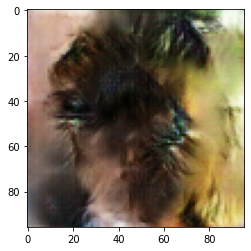

600
tf.Tensor(1181.096, shape=(), dtype=float32) tf.Tensor(-2647.6675, shape=(), dtype=float32)


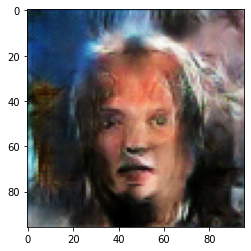

900
tf.Tensor(1200.1185, shape=(), dtype=float32) tf.Tensor(-2672.5508, shape=(), dtype=float32)


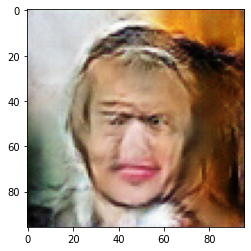

1200
tf.Tensor(1202.8048, shape=(), dtype=float32) tf.Tensor(-2675.2869, shape=(), dtype=float32)


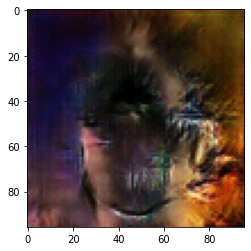

1500
tf.Tensor(1211.4658, shape=(), dtype=float32) tf.Tensor(-2688.9265, shape=(), dtype=float32)


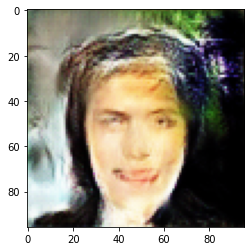

1800
tf.Tensor(1218.0365, shape=(), dtype=float32) tf.Tensor(-2701.2424, shape=(), dtype=float32)


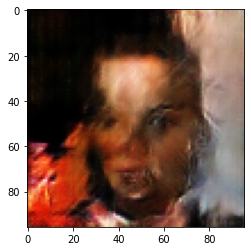

2100
tf.Tensor(1230.3094, shape=(), dtype=float32) tf.Tensor(-2710.5212, shape=(), dtype=float32)


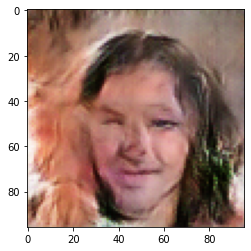

2400
tf.Tensor(1243.0074, shape=(), dtype=float32) tf.Tensor(-2724.2488, shape=(), dtype=float32)


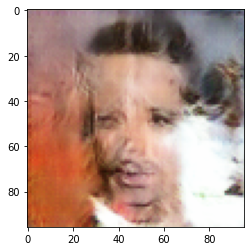

INFO:tensorflow:Assets written to: /content/gdrive/MyDrive/generator-VWGAN-SN/assets


INFO:tensorflow:Assets written to: /content/gdrive/MyDrive/generator-VWGAN-SN/assets


INFO:tensorflow:Assets written to: /content/gdrive/MyDrive/discriminator-VWGAN-SN/assets


INFO:tensorflow:Assets written to: /content/gdrive/MyDrive/discriminator-VWGAN-SN/assets


Epoch 12, gen loss=1253.865478515625,disc loss=-2737.6162109375,
Accuracy:  0.5001809865411827
Accuracy on fake:  1.0003619730823654
300
tf.Tensor(1384.7905, shape=(), dtype=float32) tf.Tensor(-2909.284, shape=(), dtype=float32)


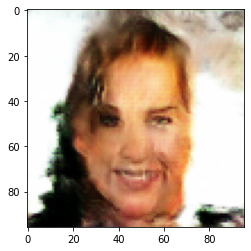

600
tf.Tensor(1394.1083, shape=(), dtype=float32) tf.Tensor(-2917.286, shape=(), dtype=float32)


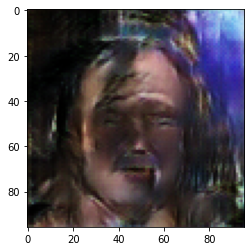

900
tf.Tensor(1409.1041, shape=(), dtype=float32) tf.Tensor(-2932.8137, shape=(), dtype=float32)


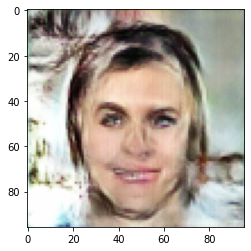

1200
tf.Tensor(1404.7181, shape=(), dtype=float32) tf.Tensor(-2943.4, shape=(), dtype=float32)


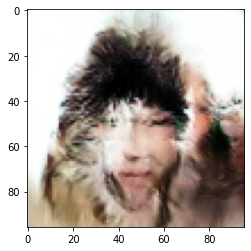

1500
tf.Tensor(1424.5309, shape=(), dtype=float32) tf.Tensor(-2950.9917, shape=(), dtype=float32)


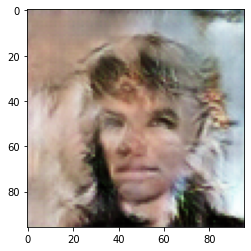

1800
tf.Tensor(1418.134, shape=(), dtype=float32) tf.Tensor(-2956.2615, shape=(), dtype=float32)


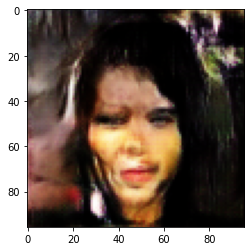

2100
tf.Tensor(1431.0342, shape=(), dtype=float32) tf.Tensor(-2968.2163, shape=(), dtype=float32)


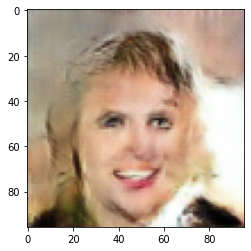

2400
tf.Tensor(1437.7119, shape=(), dtype=float32) tf.Tensor(-2978.3254, shape=(), dtype=float32)


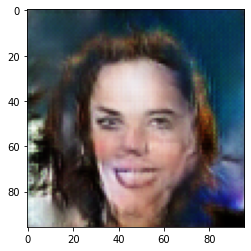

INFO:tensorflow:Assets written to: /content/gdrive/MyDrive/generator-VWGAN-SN/assets


INFO:tensorflow:Assets written to: /content/gdrive/MyDrive/generator-VWGAN-SN/assets


INFO:tensorflow:Assets written to: /content/gdrive/MyDrive/discriminator-VWGAN-SN/assets


INFO:tensorflow:Assets written to: /content/gdrive/MyDrive/discriminator-VWGAN-SN/assets


Epoch 13, gen loss=1442.284912109375,disc loss=-2985.81396484375,
Accuracy:  0.5001809865411827
Accuracy on fake:  1.0003619730823654
300
tf.Tensor(1546.3704, shape=(), dtype=float32) tf.Tensor(-3106.0037, shape=(), dtype=float32)


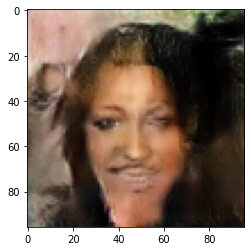

600
tf.Tensor(1547.1027, shape=(), dtype=float32) tf.Tensor(-3130.91, shape=(), dtype=float32)


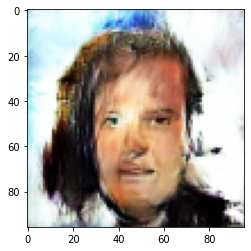

900
tf.Tensor(1550.7584, shape=(), dtype=float32) tf.Tensor(-3142.3489, shape=(), dtype=float32)


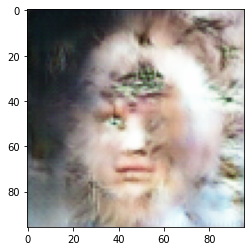

1200
tf.Tensor(1562.9966, shape=(), dtype=float32) tf.Tensor(-3159.0518, shape=(), dtype=float32)


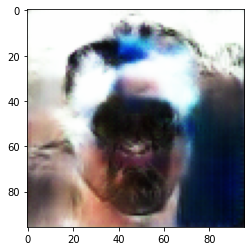

1500
tf.Tensor(1561.9465, shape=(), dtype=float32) tf.Tensor(-3173.6658, shape=(), dtype=float32)


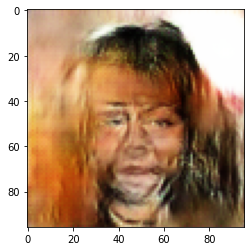

1800
tf.Tensor(1567.6307, shape=(), dtype=float32) tf.Tensor(-3186.5847, shape=(), dtype=float32)


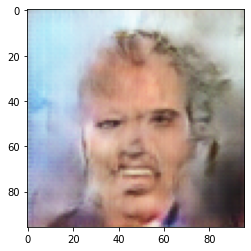

2100
tf.Tensor(1578.6786, shape=(), dtype=float32) tf.Tensor(-3197.955, shape=(), dtype=float32)


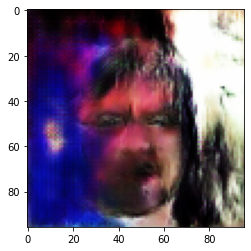

2400
tf.Tensor(1576.6918, shape=(), dtype=float32) tf.Tensor(-3203.7224, shape=(), dtype=float32)


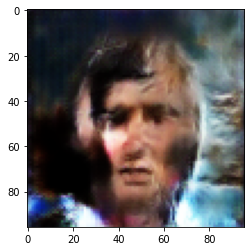

INFO:tensorflow:Assets written to: /content/gdrive/MyDrive/generator-VWGAN-SN/assets


INFO:tensorflow:Assets written to: /content/gdrive/MyDrive/generator-VWGAN-SN/assets


INFO:tensorflow:Assets written to: /content/gdrive/MyDrive/discriminator-VWGAN-SN/assets


INFO:tensorflow:Assets written to: /content/gdrive/MyDrive/discriminator-VWGAN-SN/assets


Epoch 14, gen loss=1577.2598876953125,disc loss=-3208.03271484375,
Accuracy:  0.5001809865411827
Accuracy on fake:  1.0003619730823654
300
tf.Tensor(1636.1685, shape=(), dtype=float32) tf.Tensor(-3265.0793, shape=(), dtype=float32)


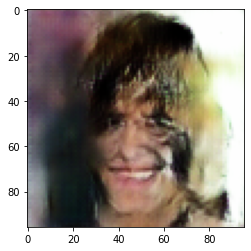

600
tf.Tensor(1635.8341, shape=(), dtype=float32) tf.Tensor(-3290.5625, shape=(), dtype=float32)


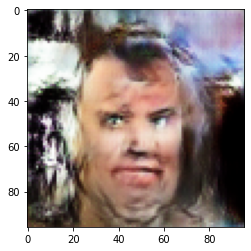

900
tf.Tensor(1631.734, shape=(), dtype=float32) tf.Tensor(-3296.3652, shape=(), dtype=float32)


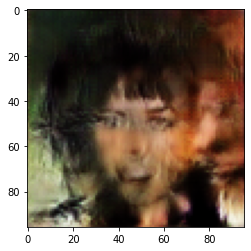

1200
tf.Tensor(1634.3214, shape=(), dtype=float32) tf.Tensor(-3307.5361, shape=(), dtype=float32)


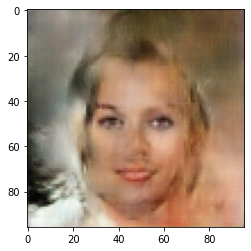

1500
tf.Tensor(1628.2606, shape=(), dtype=float32) tf.Tensor(-3291.609, shape=(), dtype=float32)


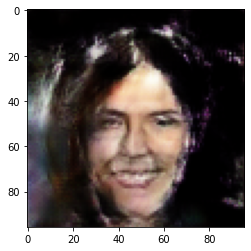

1800
tf.Tensor(1626.4463, shape=(), dtype=float32) tf.Tensor(-3292.4817, shape=(), dtype=float32)


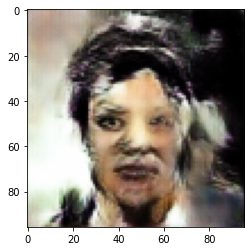

2100
tf.Tensor(1614.5293, shape=(), dtype=float32) tf.Tensor(-3293.177, shape=(), dtype=float32)


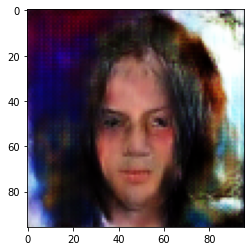

2400
tf.Tensor(1617.152, shape=(), dtype=float32) tf.Tensor(-3293.1655, shape=(), dtype=float32)


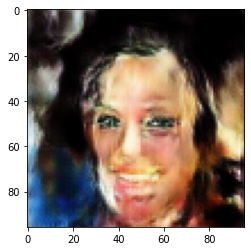

INFO:tensorflow:Assets written to: /content/gdrive/MyDrive/generator-VWGAN-SN/assets


INFO:tensorflow:Assets written to: /content/gdrive/MyDrive/generator-VWGAN-SN/assets


INFO:tensorflow:Assets written to: /content/gdrive/MyDrive/discriminator-VWGAN-SN/assets


INFO:tensorflow:Assets written to: /content/gdrive/MyDrive/discriminator-VWGAN-SN/assets


Epoch 15, gen loss=1617.67431640625,disc loss=-3296.34765625,
Accuracy:  0.5001809865411827
Accuracy on fake:  1.0003619730823654
300
tf.Tensor(1715.3706, shape=(), dtype=float32) tf.Tensor(-3475.9304, shape=(), dtype=float32)


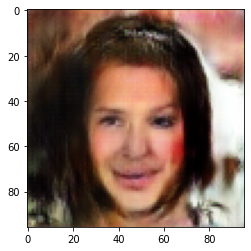

600
tf.Tensor(1684.9274, shape=(), dtype=float32) tf.Tensor(-3452.044, shape=(), dtype=float32)


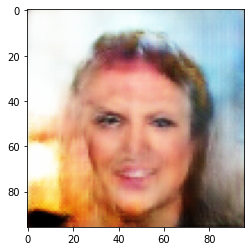

900
tf.Tensor(1698.2909, shape=(), dtype=float32) tf.Tensor(-3460.4558, shape=(), dtype=float32)


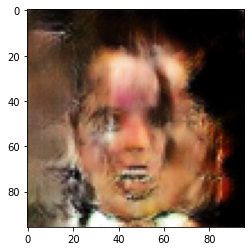

1200
tf.Tensor(1699.0305, shape=(), dtype=float32) tf.Tensor(-3464.6255, shape=(), dtype=float32)


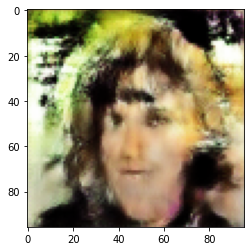

1500
tf.Tensor(1695.9531, shape=(), dtype=float32) tf.Tensor(-3451.4314, shape=(), dtype=float32)


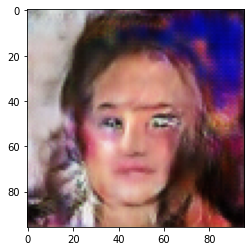

1800
tf.Tensor(1705.8214, shape=(), dtype=float32) tf.Tensor(-3470.6147, shape=(), dtype=float32)


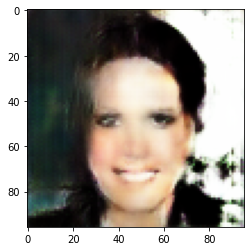

2100
tf.Tensor(1722.424, shape=(), dtype=float32) tf.Tensor(-3490.8904, shape=(), dtype=float32)


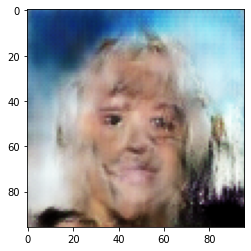

2400
tf.Tensor(1721.5042, shape=(), dtype=float32) tf.Tensor(-3497.211, shape=(), dtype=float32)


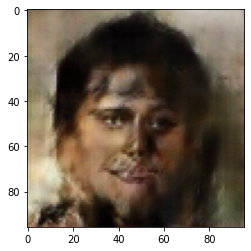

INFO:tensorflow:Assets written to: /content/gdrive/MyDrive/generator-VWGAN-SN/assets


INFO:tensorflow:Assets written to: /content/gdrive/MyDrive/generator-VWGAN-SN/assets


INFO:tensorflow:Assets written to: /content/gdrive/MyDrive/discriminator-VWGAN-SN/assets


INFO:tensorflow:Assets written to: /content/gdrive/MyDrive/discriminator-VWGAN-SN/assets


Epoch 16, gen loss=1733.9468994140625,disc loss=-3520.779541015625,
Accuracy:  0.5001809865411827
Accuracy on fake:  1.0003619730823654
300
tf.Tensor(1734.2334, shape=(), dtype=float32) tf.Tensor(-3619.8657, shape=(), dtype=float32)


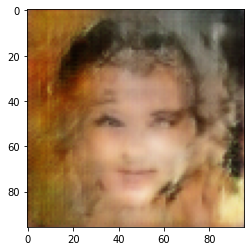

600
tf.Tensor(1788.6375, shape=(), dtype=float32) tf.Tensor(-3702.0745, shape=(), dtype=float32)


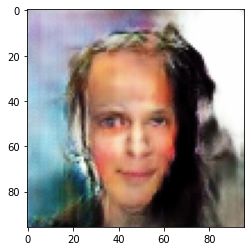

900
tf.Tensor(1802.1521, shape=(), dtype=float32) tf.Tensor(-3723.7197, shape=(), dtype=float32)


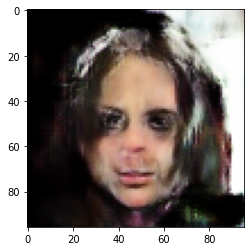

1200
tf.Tensor(1804.8063, shape=(), dtype=float32) tf.Tensor(-3737.5903, shape=(), dtype=float32)


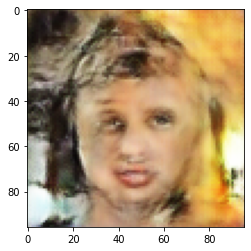

1500
tf.Tensor(1794.6902, shape=(), dtype=float32) tf.Tensor(-3736.426, shape=(), dtype=float32)


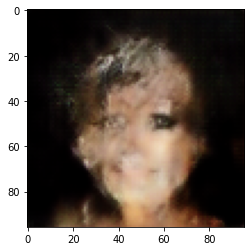

1800
tf.Tensor(1812.4514, shape=(), dtype=float32) tf.Tensor(-3761.8496, shape=(), dtype=float32)


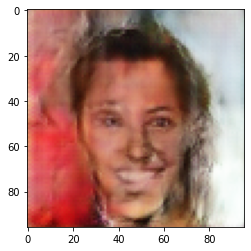

2100
tf.Tensor(1806.2312, shape=(), dtype=float32) tf.Tensor(-3758.2292, shape=(), dtype=float32)


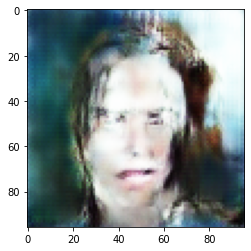

2400
tf.Tensor(1809.0642, shape=(), dtype=float32) tf.Tensor(-3766.9854, shape=(), dtype=float32)


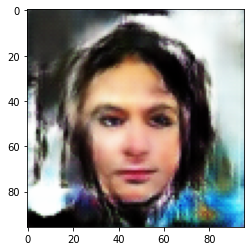

INFO:tensorflow:Assets written to: /content/gdrive/MyDrive/generator-VWGAN-SN/assets


INFO:tensorflow:Assets written to: /content/gdrive/MyDrive/generator-VWGAN-SN/assets


INFO:tensorflow:Assets written to: /content/gdrive/MyDrive/discriminator-VWGAN-SN/assets


INFO:tensorflow:Assets written to: /content/gdrive/MyDrive/discriminator-VWGAN-SN/assets


Epoch 17, gen loss=1816.887939453125,disc loss=-3776.0498046875,
Accuracy:  0.5001809865411827
Accuracy on fake:  1.0003619730823654
300
tf.Tensor(1956.5371, shape=(), dtype=float32) tf.Tensor(-3916.5059, shape=(), dtype=float32)


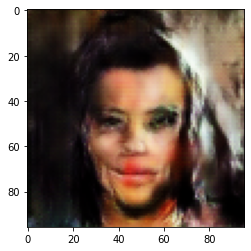

600
tf.Tensor(1945.3804, shape=(), dtype=float32) tf.Tensor(-3898.7742, shape=(), dtype=float32)


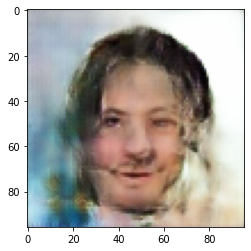

900
tf.Tensor(1925.3315, shape=(), dtype=float32) tf.Tensor(-3897.7605, shape=(), dtype=float32)


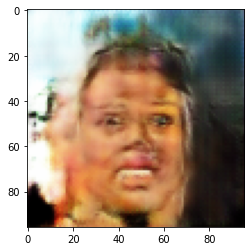

1200
tf.Tensor(1929.0312, shape=(), dtype=float32) tf.Tensor(-3892.7375, shape=(), dtype=float32)


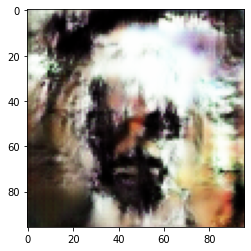

1500
tf.Tensor(1938.3718, shape=(), dtype=float32) tf.Tensor(-3891.0054, shape=(), dtype=float32)


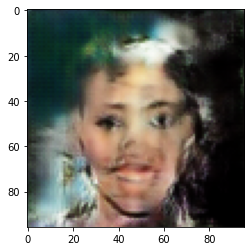

1800
tf.Tensor(1933.4839, shape=(), dtype=float32) tf.Tensor(-3887.535, shape=(), dtype=float32)


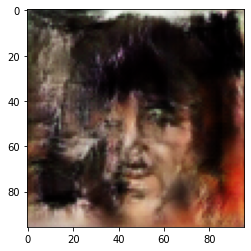

2100
tf.Tensor(1938.2278, shape=(), dtype=float32) tf.Tensor(-3893.0298, shape=(), dtype=float32)


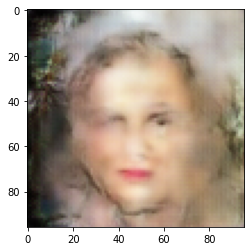

2400
tf.Tensor(1930.6807, shape=(), dtype=float32) tf.Tensor(-3875.9133, shape=(), dtype=float32)


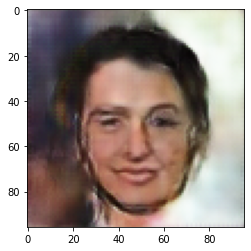

INFO:tensorflow:Assets written to: /content/gdrive/MyDrive/generator-VWGAN-SN/assets


INFO:tensorflow:Assets written to: /content/gdrive/MyDrive/generator-VWGAN-SN/assets


INFO:tensorflow:Assets written to: /content/gdrive/MyDrive/discriminator-VWGAN-SN/assets


INFO:tensorflow:Assets written to: /content/gdrive/MyDrive/discriminator-VWGAN-SN/assets


Epoch 18, gen loss=1920.928466796875,disc loss=-3859.0830078125,
Accuracy:  0.5001809865411827
Accuracy on fake:  1.0003619730823654
300
tf.Tensor(1936.3752, shape=(), dtype=float32) tf.Tensor(-3841.7876, shape=(), dtype=float32)


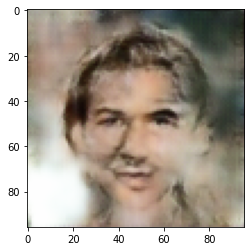

600
tf.Tensor(1885.0325, shape=(), dtype=float32) tf.Tensor(-3733.463, shape=(), dtype=float32)


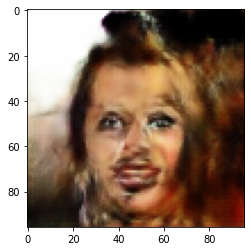

900
tf.Tensor(1875.9923, shape=(), dtype=float32) tf.Tensor(-3764.404, shape=(), dtype=float32)


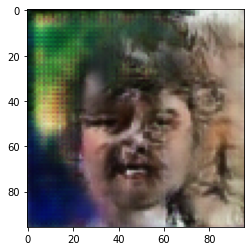

1200
tf.Tensor(1835.3181, shape=(), dtype=float32) tf.Tensor(-3712.704, shape=(), dtype=float32)


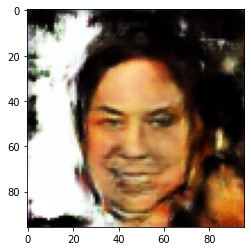

1500
tf.Tensor(1878.6703, shape=(), dtype=float32) tf.Tensor(-3771.679, shape=(), dtype=float32)


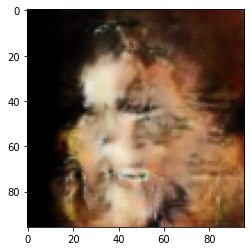

1800
tf.Tensor(1899.6034, shape=(), dtype=float32) tf.Tensor(-3803.6982, shape=(), dtype=float32)


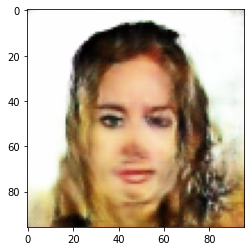

2100
tf.Tensor(1929.3635, shape=(), dtype=float32) tf.Tensor(-3854.4473, shape=(), dtype=float32)


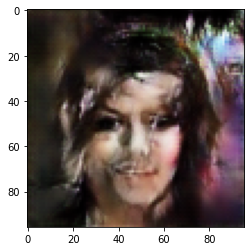

2400
tf.Tensor(1927.9567, shape=(), dtype=float32) tf.Tensor(-3855.3367, shape=(), dtype=float32)


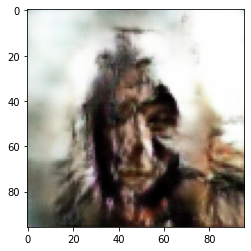

INFO:tensorflow:Assets written to: /content/gdrive/MyDrive/generator-VWGAN-SN/assets


INFO:tensorflow:Assets written to: /content/gdrive/MyDrive/generator-VWGAN-SN/assets


INFO:tensorflow:Assets written to: /content/gdrive/MyDrive/discriminator-VWGAN-SN/assets


INFO:tensorflow:Assets written to: /content/gdrive/MyDrive/discriminator-VWGAN-SN/assets


Epoch 19, gen loss=1919.408935546875,disc loss=-3834.57470703125,
Accuracy:  0.5001809865411827
Accuracy on fake:  1.0003619730823654
300
tf.Tensor(1952.445, shape=(), dtype=float32) tf.Tensor(-3849.3066, shape=(), dtype=float32)


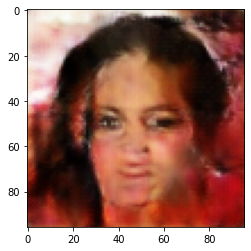

600
tf.Tensor(1930.256, shape=(), dtype=float32) tf.Tensor(-3924.1887, shape=(), dtype=float32)


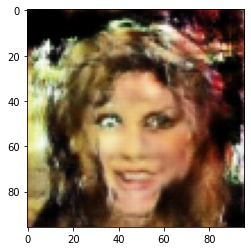

900
tf.Tensor(1976.8739, shape=(), dtype=float32) tf.Tensor(-3976.0142, shape=(), dtype=float32)


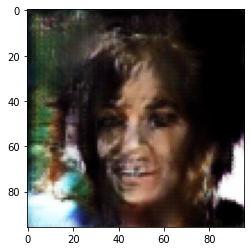

1200
tf.Tensor(2007.7163, shape=(), dtype=float32) tf.Tensor(-4024.7217, shape=(), dtype=float32)


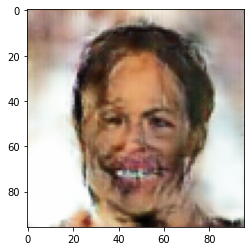

1500
tf.Tensor(2028.944, shape=(), dtype=float32) tf.Tensor(-4046.1028, shape=(), dtype=float32)


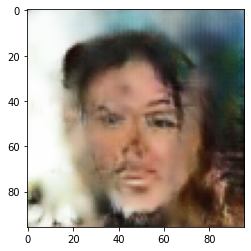

1800
tf.Tensor(2019.143, shape=(), dtype=float32) tf.Tensor(-4049.7004, shape=(), dtype=float32)


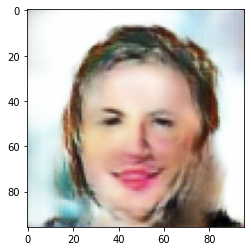

2100
tf.Tensor(2026.4595, shape=(), dtype=float32) tf.Tensor(-4061.4854, shape=(), dtype=float32)


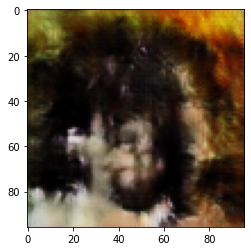

2400
tf.Tensor(2026.3821, shape=(), dtype=float32) tf.Tensor(-4066.431, shape=(), dtype=float32)


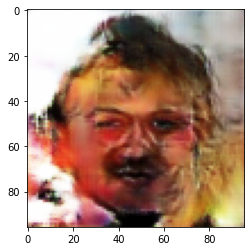

INFO:tensorflow:Assets written to: /content/gdrive/MyDrive/generator-VWGAN-SN/assets


INFO:tensorflow:Assets written to: /content/gdrive/MyDrive/generator-VWGAN-SN/assets


INFO:tensorflow:Assets written to: /content/gdrive/MyDrive/discriminator-VWGAN-SN/assets


INFO:tensorflow:Assets written to: /content/gdrive/MyDrive/discriminator-VWGAN-SN/assets


Epoch 20, gen loss=2037.4075927734375,disc loss=-4083.541259765625,
Accuracy:  0.5001809865411827
Accuracy on fake:  1.0003619730823654


In [ ]:
fixed_seed = np.random.normal(0, 1, (PREVIEW_ROWS * PREVIEW_COLS, SEED_SIZE))
epochs = 20

for epoch in range(epochs):

  gen_loss_list = []
  disc_loss_list = []

  batchNum = 0
  for image_batch in trainData:
    if image_batch.shape[0] == 64:
      for i in range(3):
        t = train_step_disc(image_batch)
        disc_loss_list.append(t)
      t = train_step(image_batch)
      gen_loss_list.append(t[0]) 
      disc_loss_list.append(t[1])
      batchNum = batchNum + 1
    if batchNum % 300 == 0:
      print(batchNum)
      print(sum(gen_loss_list) / len(gen_loss_list), sum(disc_loss_list) / len(disc_loss_list))
      noise = tf.random.normal([1, SEED_SIZE])
      generated_image = generator(noise, training=False)
      plt.imshow(generated_image[0])
      #plt.savefig("generatedImage"+str(epoch)+"-"+str(batchNum))
      plt.show()
  
  generator.save("/content/gdrive/MyDrive/generator-VWGAN-SN")
  discriminator.save("/content/gdrive/MyDrive/discriminator-VWGAN-SN")
  
  correct = 0
  correct_fake = 0
  totalSize = val_size*2
  for image_batch in valData:
    realVal, fakeVal = val_step(image_batch)
    realVal = realVal.numpy() > 0
    fakeVal = fakeVal.numpy() < 0
    correct = correct + np.count_nonzero(realVal) + np.count_nonzero(fakeVal)
    correct_fake = correct_fake + np.count_nonzero(fakeVal)

  g_loss = sum(gen_loss_list) / len(gen_loss_list)
  d_loss = sum(disc_loss_list) / len(disc_loss_list)

  print (f'Epoch {epoch+1}, gen loss={g_loss},disc loss={d_loss},')
  print ("Accuracy: ", 1.0*correct/totalSize)
  print ("Accuracy on fake: ", 1.0*correct_fake/val_size)